# ST-PAIN V2
## (10x Visium of anterior mouse brain + scRNA-seq data of mouse brain)

In [1]:
import os
import glob
from tqdm import tqdm
import configparser
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
from PIL import Image
from scipy.stats import spearmanr
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import TensorBoard, CSVLogger, ModelCheckpoint
from VQVAE import VQVAETrainer, DataGenerator as VQVAEDataGenerator
from STAnDv1_6 import STAnD, DataGenerator as STAnDDataGenerator 
from STPAINv2 import pseudospot_generator, train

In [2]:
gpu_device_list = tf.config.list_physical_devices('GPU')
print("Num GPUs Available: ", len(gpu_device_list))
for gpu_device in gpu_device_list: tf.config.experimental.set_memory_growth(gpu_device, True)

Num GPUs Available:  1


2022-04-04 11:11:05.764254: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-04 11:11:05.786607: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-04 11:11:05.786773: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


## 1. Data load

Jump to [Load QC'ed Data If Available](#Load-QC'ed-Data-If-Available)

### load scanpy data - 10x datasets

In [3]:
spatial_data_filename = "./data/Visium_FFPE_Mouse_Brain/Visium_FFPE_Mouse_Brain_filtered_feature_bc_matrix.h5"
spatial_image_folder = "./data/Visium_FFPE_Mouse_Brain/images"

In [4]:
adata_spatial = sc.read_visium(os.path.os.path.dirname(spatial_data_filename), count_file=os.path.os.path.basename(spatial_data_filename))
adata_spatial.var_names_make_unique()
adata_spatial.var["mt"] = adata_spatial.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata_spatial, qc_vars=["mt"], inplace=True)

/opt/anaconda3/envs/p/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


### QC and preprocessing

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='n_genes_by_counts'>

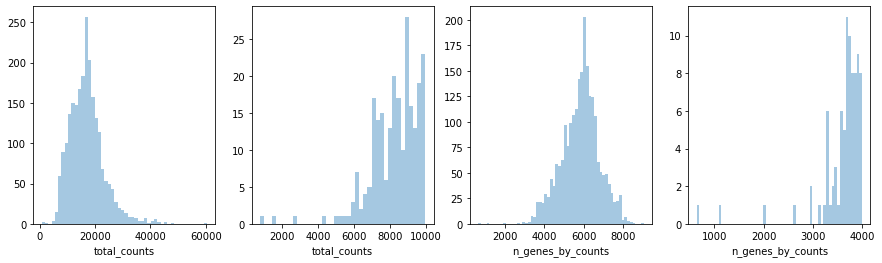

In [5]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata_spatial.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata_spatial.obs["total_counts"][adata_spatial.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.distplot(adata_spatial.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(adata_spatial.obs["n_genes_by_counts"][adata_spatial.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])

In [6]:
adata_spatial = adata_spatial[adata_spatial.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata_spatial.n_obs}")

#cells after MT filter: 2264


In [7]:
sc.pp.normalize_total(adata_spatial, inplace=True)

/opt/anaconda3/envs/p/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [8]:
sc.pp.log1p(adata_spatial)

In [9]:
sc.pp.highly_variable_genes(adata_spatial, flavor="seurat", n_top_genes=2000)

In [10]:
sc.pp.pca(adata_spatial)
sc.pp.neighbors(adata_spatial)
sc.tl.umap(adata_spatial)
sc.tl.leiden(adata_spatial, key_added="clusters")

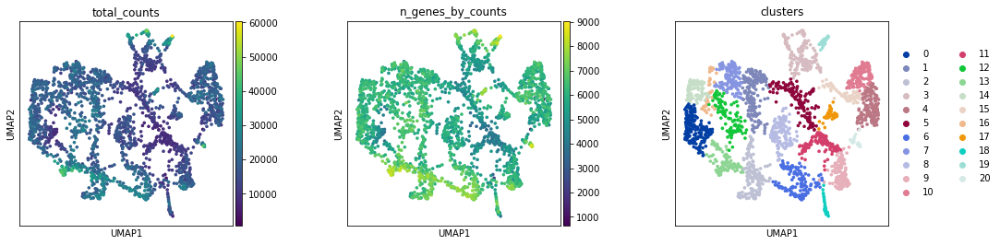

In [11]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata_spatial, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

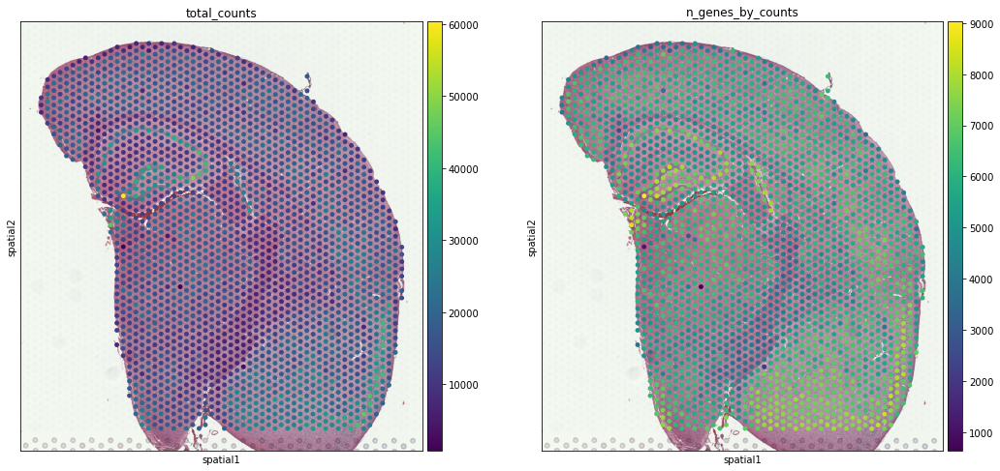

In [12]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata_spatial, img_key="hires", color=["total_counts", "n_genes_by_counts"])

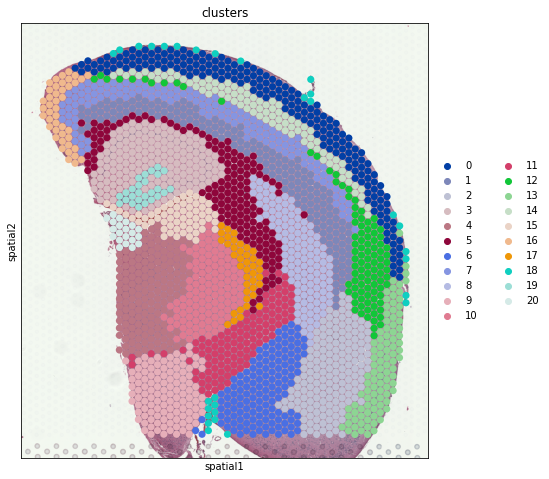

In [13]:
sc.pl.spatial(adata_spatial, img_key="hires", color="clusters", size=1.5)

categories: 0, 1, 2, etc.
var_group_labels: 5


/opt/anaconda3/envs/p/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/opt/anaconda3/envs/p/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/opt/anaconda3/envs/p/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmente

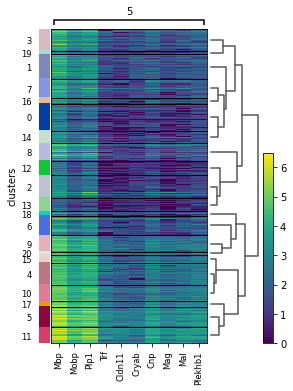

In [14]:
sc.tl.rank_genes_groups(adata_spatial, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata_spatial, groups="5", n_genes=10, groupby="clusters")

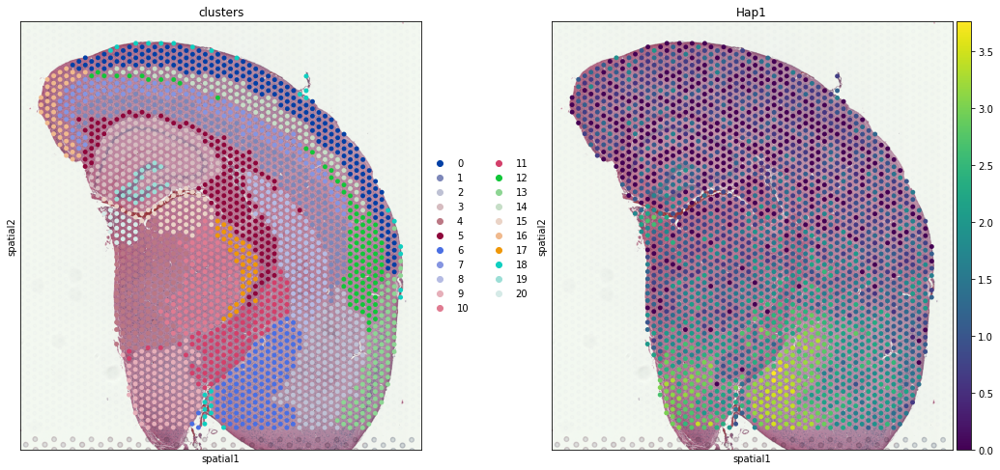

In [15]:
sc.pl.spatial(adata_spatial, img_key="hires", color=["clusters", "Hap1"])

### Single cell Data: GSE115746 
 - Download from GEO and use two files "GSE115746_cells_exon_counts.csv" and "GSE115746_complete_metadata_28706-cells.csv"

In [16]:
adata_singlecell = sc.read_csv('./data/GSE115746_cells_exon_counts.csv').T
adata_singlecell_meta = pd.read_csv('./data/GSE115746_complete_metadata_28706-cells.csv', index_col=0)
adata_singlecell.obs = adata_singlecell_meta.loc[adata_singlecell.obs.index,]
adata_singlecell.var_names_make_unique()  

In [17]:
adata_singlecell.var['mt'] = adata_singlecell.var_names.str.startswith('Mt-') 
sc.pp.calculate_qc_metrics(adata_singlecell, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [18]:
sc.pp.normalize_total(adata_singlecell)

In [19]:
sc.pp.log1p(adata_singlecell)  

In [20]:
sc.pp.highly_variable_genes(adata_spatial, flavor="seurat", n_top_genes=2000)

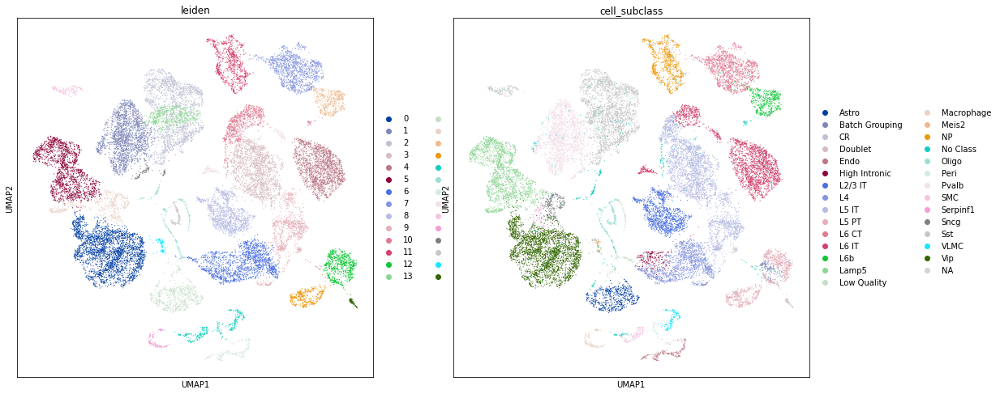

In [21]:
#PCA and clustering : Known markers with 'cell_subclass'
sc.tl.pca(adata_singlecell, svd_solver='arpack')
sc.pp.neighbors(adata_singlecell, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_singlecell)
sc.tl.leiden(adata_singlecell, resolution = 0.5)
sc.pl.umap(adata_singlecell, color=['leiden','cell_subclass'])

/opt/anaconda3/envs/p/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/opt/anaconda3/envs/p/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/opt/anaconda3/envs/p/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmente

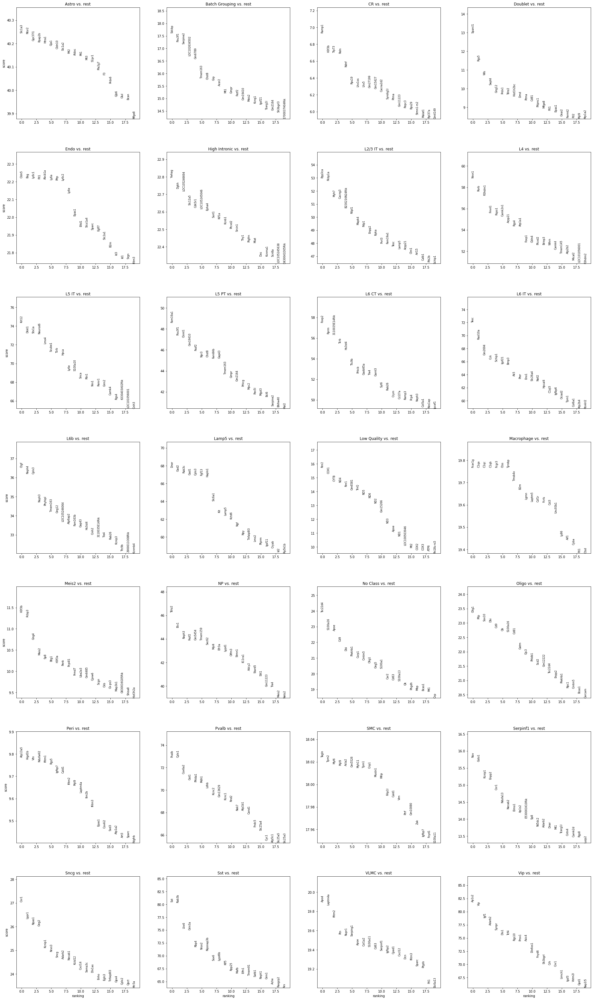

In [22]:
sc.tl.rank_genes_groups(adata_singlecell, 'cell_subclass', method='wilcoxon')
sc.pl.rank_genes_groups(adata_singlecell, n_genes=20, sharey=False)

In [23]:
ranked_gene_list=adata_singlecell.uns['rank_genes_groups']['names']
df_ranked_gene_list = pd.DataFrame.from_records(ranked_gene_list)
df_ranked_gene_list.head(5)

,Astro,Batch Grouping,CR,Doublet,Endo,High Intronic,L2/3 IT,L4,L5 IT,L5 PT,...,No Class,Oligo,Peri,Pvalb,SMC,Serpinf1,Sncg,Sst,VLMC,Vip
0,Slc1a3,Sdcbp,Ramp1,Sparcl1,Cldn5,Ywhag,Ppp3ca,Nrxn1,Krt12,Fam19a1,...,Tsc22d4,Olig1,Atp13a5,Pvalb,Tagln,Nov,Cnr1,Sst,Apod,Ap1s2
1,Ntsr2,Pou3f1,H3f3b,Rgs5,Bsg,Dgkh,Fkbp1a,Rorb,Dkkl1,Pou3f1,...,S100a16,Pllp,Higd1b,Cplx1,Tpm2,Gsto1,Lppr1,Rab3b,Laptm4a,Vip
2,Gpr37l1,Serpine2,Trp73,Wls,Ly6c1,LOC105246694,Myh7,R3hdm1,Stx1a,Ckmt1,...,Apoe,Sox10,Vtn,Cox6a2,Myl6,Kcnip1,Npas1,Lhx6,Ifitm2,Igf1
3,Ppap2b,LOC102634502,Reln,Sept4,Flt1,Slc12a5,Cacng3,Fmnl1,Neurod6,Gm19410,...,Cd9,Dbi,Ndufa4l2,Got1,Myl9,Enpp2,Gng2,Grin3a,Ptn,Adarb2
4,Htra1,Gm6789,Ndnf,Gng12,Abcb1a,Cdk5r1,B230216N24Rik,Rspo1,Lmo4,Fezf2,...,Dbi,Cd9,Ifitm1,Phlda1,Acta2,Cnr1,Kcnip1,Rbp4,Nupr1,Synpr


In [24]:
num_markers=10
key_genes = []
for column in df_ranked_gene_list.head(num_markers): 
    key_genes.extend(df_ranked_gene_list.head(num_markers)[column].tolist())
key_genes = list(set(key_genes))

In [25]:
key_genes = [val for val in key_genes if val in adata_spatial.var.index]
inter_genes = [val for val in adata_singlecell.var.index if val in adata_spatial.var.index]
print('Selected Feature Gene number for Cell Sub-typing',len(key_genes))
print('Intersection of Single Cell and Spatial Gene number',len(inter_genes))

Selected Feature Gene number for Cell Sub-typing 214
Intersection of Single Cell and Spatial Gene number 18486


In [26]:
adata_spatial = adata_spatial[:,inter_genes]
adata_singlecell = adata_singlecell[:,inter_genes]

In [27]:
obs_list = []
sampling_size = 28
for obs in tqdm(adata_spatial.obs_names.tolist()):
    img_list = glob.glob(os.path.join(spatial_image_folder, obs, '*.png'))
    prediction_data = []
    for fn in img_list:
        img = Image.open(fn)
        img.load()
        img = img.resize((sampling_size, sampling_size), Image.BICUBIC)
        data = np.asarray( img, dtype="int32" )
        data = np.expand_dims(data, axis=0)
        prediction_data.append(data)

    if len(prediction_data) > 0:
        obs_list.append(obs)
        
print('Total spot num:',len(adata_spatial.obs_names.tolist()))
print('Available spot num:',len(obs_list))

100%|██████████████████████████████████████| 2264/2264 [00:04<00:00, 481.17it/s]

Total spot num: 2264
Available spot num: 2227


In [28]:
adata_spatial = adata_spatial[obs_list,:]

In [29]:
cell_subclass = list(set(adata_singlecell.obs['cell_subclass']))

In [30]:
cell_indices = adata_singlecell.obs['cell_subclass'][adata_singlecell.obs['cell_subclass'].isin(cell_subclass)].index
adata_singlecell = adata_singlecell[cell_indices,:]
print('Selected Cell number',len(cell_indices))

Selected Cell number 23178


### Compute ST-AnD

In [31]:
vqvae_batch_size = 128
vqvae_x_train = VQVAEDataGenerator(image_folder=spatial_image_folder, 
                                   batch_size = vqvae_batch_size, 
                                   random_seed=1234, 
                                   k=10, m_list=[0,1,2,3,4,5,6,7,8,9]) 

In [32]:
sampling_size = 28
latent_dim = 16
num_embeddings = 1024
image_pixel_size = 0.5

data_variance = vqvae_x_train.get_variance()

vqvae_trainer = VQVAETrainer(data_variance, 
                             image_size=sampling_size, 
                             latent_dim=latent_dim, 
                             num_embeddings=num_embeddings)

vqvae_trainer.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
vqvae_trainer.vqvae.summary()

Model: "vq_vae"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 28, 28, 3)]       0         
                                                                 
 encoder (Functional)        (None, 7, 7, 16)          20432     
                                                                 
 vector_quantizer (VectorQua  (None, 7, 7, 16)         16384     
 ntizer)                                                         
                                                                 
 decoder (Functional)        (None, 28, 28, 3)         28611     
                                                                 
Total params: 65,427
Trainable params: 65,427
Non-trainable params: 0
_________________________________________________________________


2022-04-04 08:18:45.136267: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-04-04 08:18:45.136797: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-04 08:18:45.136999: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-04 08:18:45.137133: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so retur

In [33]:
encoder_model_filename = 'encoder-final.model.h5'

In [34]:
vqvae_trainer.vqvae.load_weights(encoder_model_filename)

In [35]:
stand_batch_size = 8
gene_list = adata_spatial.var_names.tolist()
decoder_input_dim = int(np.prod(vqvae_trainer.vqvae.get_layer('encoder').predict(vqvae_x_train[0]).shape[1:]))
vqvae_encoder = vqvae_trainer.vqvae.get_layer("encoder")
vqvae_quantizer = vqvae_trainer.vqvae.get_layer("vector_quantizer")

stand_x_train = STAnDDataGenerator(image_folder='data/Visium_FFPE_Mouse_Brain/images', 
                                   sptx_data=adata_spatial, 
                                   gene_list=gene_list, 
                                   vqvae_encoder=vqvae_encoder, 
                                   vqvae_quantizer=vqvae_quantizer, 
                                   batch_size = stand_batch_size, 
                                   random_seed=1234, 
                                   k=10, 
                                   m_list=[0,1,2,3,4,5,6,7,8])

stand_x_test = STAnDDataGenerator(image_folder='data/Visium_FFPE_Mouse_Brain/images', 
                                  sptx_data=adata_spatial, 
                                  gene_list=gene_list, 
                                  vqvae_encoder=vqvae_encoder, 
                                  vqvae_quantizer=vqvae_quantizer, 
                                  batch_size = stand_batch_size, 
                                  random_seed=1234, 
                                  k=10, 
                                  m_list=[9])

2022-04-04 08:18:46.028388: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8201
2022-04-04 08:18:46.338399: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


In [36]:
decoder_hidden_layers = [len(gene_list),]
pooling = True
pooling_type = 'mean'
pooling_gamma = 5.0

stand = STAnD(input_dim = decoder_input_dim, 
              output_dim = len(gene_list),               
              decoder_hidden_layers = decoder_hidden_layers, 
              batch_size=stand_batch_size, 
              pooling=pooling, 
              pooling_type=pooling_type, 
              pooling_gamma=pooling_gamma,
              name='stand')

stand.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
stand.summary()

Model: "st_an_d_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 784)]             0         
                                                                 
 cell_fcn_layer_0 (Dense)    (None, 18486)             14511510  
                                                                 
 cell_fcn_dropout_0 (Dropout  (None, 18486)            0         
 )                                                               
                                                                 
 cell_fcn_batchnormalization  (None, 18486)            73944     
 _0 (BatchNormalization)                                         
                                                                 
 cell_fcn_activation_0 (Acti  (None, 18486)            0         
 vation)                                                         
                                                         

In [37]:
decoder_model_filename = "decoder_standv1.6-final.model.h5"

In [38]:
stand.load_weights(decoder_model_filename)

In [39]:
obs_list = adata_spatial.obs_names.tolist()
stand.set_pooling(True)

y_list = []
for obs in tqdm(obs_list):
    img_list = glob.glob(os.path.join(spatial_image_folder, obs, '*.png'))
    prediction_data = []
    for fn in img_list:
        img = Image.open(fn)
        img.load()
        img = img.resize((sampling_size, sampling_size), Image.BICUBIC)
        data = np.asarray( img, dtype="int32" )
        data = np.expand_dims(data, axis=0)
        prediction_data.append(data)

    if len(prediction_data) > 0:
        prediction_data = np.concatenate(prediction_data)
        prediction_data = (prediction_data / 255.0) - 0.5

        encoded_outputs = vqvae_encoder.predict(prediction_data)
        flat_enc_outputs = encoded_outputs.reshape(-1, encoded_outputs.shape[-1])
        z = vqvae_quantizer.get_quantized_latent_value(flat_enc_outputs)
        z = z.numpy().reshape((prediction_data.shape[0], encoded_outputs.shape[1], encoded_outputs.shape[2], encoded_outputs.shape[3]))
        z = z.reshape(prediction_data.shape[0], encoded_outputs.shape[1]*encoded_outputs.shape[2]*encoded_outputs.shape[3])

        y = stand(z).numpy()
    else:
        y = np.zeros(shape=(1,len(inter_genes)), dtype=np.float32)
        
    y_list.append(y)
        
predicted_y = np.concatenate(y_list) 

100%|███████████████████████████████████████| 2227/2227 [01:04<00:00, 34.29it/s]


In [40]:
y_pred_list = []
y_test_list = []

stand.set_pooling(True)

for i in tqdm(range(len(stand_x_test))):
    for b in range(len(stand_x_test[i][0])):
        reduced_sum = np.sum(np.abs(stand_x_test[i][0][b]),axis=1)
        zero = np.zeros(shape=(1,1), dtype=np.float32)
        nonzero_mask = np.not_equal(reduced_sum, zero)
        z = stand_x_test[i][0][b][nonzero_mask[0],]
        # y_pred = stand.predict(z, batch_size=len(z)
        y_pred = stand(z)
        y_test = stand_x_test[i][1][b][0]
        y_pred_list.append(y_pred[0])
        y_test_list.append(y_test)

y_pred_list = np.stack(y_pred_list, axis=0).transpose()
y_test_list = np.stack(y_test_list, axis=0).transpose()

abundance_list = np.log(np.mean(np.exp(y_pred_list)-1.0, axis=1)+1.0).tolist()

r_list = []
p_list = []

for i in range(len(gene_list)):
    r, p = spearmanr(y_test_list[i], y_pred_list[i])
    r_list.append(r)
    p_list.append(p)

r_list = np.array(r_list)
p_list = np.array(p_list)

r_list[np.isnan(r_list)] = 0
p_list[np.isnan(p_list)] = 1

100%|███████████████████████████████████████████| 27/27 [02:42<00:00,  6.01s/it]
/opt/anaconda3/envs/p/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


In [41]:
spearman_analysis_df = pd.DataFrame({"gene": gene_list, "rho": r_list, "p": p_list})
spearman_analysis_df.sort_values(by="rho", ascending=False, inplace=True)

Valid genes (rho > 0): 10137 , Ratio: 0.5483609217786433
Mean Spearman's coefficient of valid genes: 0.0922008270069342


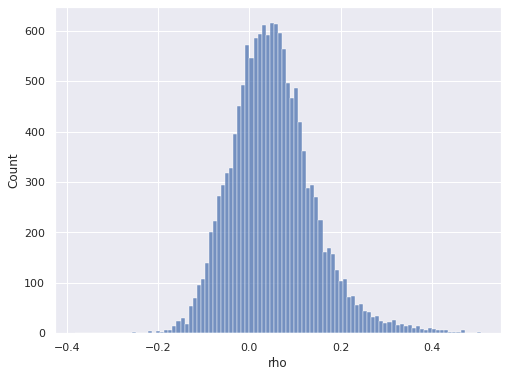

In [42]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(8,6)})
ax = sns.histplot(spearman_analysis_df[spearman_analysis_df['rho']!=0]['rho'], bins=100)
print("Valid genes (rho > 0):", (spearman_analysis_df['rho'] > 0).sum(), ", Ratio:", (spearman_analysis_df['rho'] > 0).sum()/len(spearman_analysis_df))
print("Mean Spearman's coefficient of valid genes:", spearman_analysis_df[spearman_analysis_df['rho'] > 0]['rho'].mean())

Number of genes that p-value<.05: 2281
Number of genes that p-value<.01: 1215
Number of genes that p-value<.001: 595


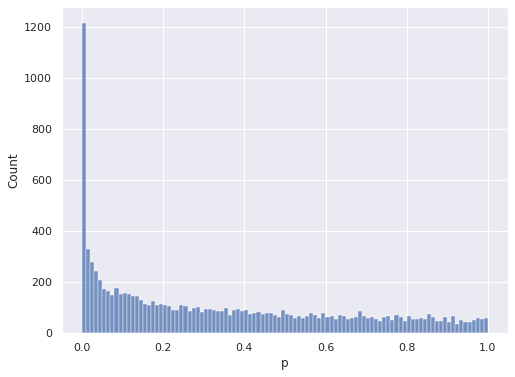

In [43]:
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(8,6)})
p_df = spearman_analysis_df[(spearman_analysis_df['rho']>0) & (spearman_analysis_df['p']<1)]
ax = sns.histplot(p_df['p'], bins=100)

p05_df = spearman_analysis_df[(spearman_analysis_df['rho']>0) & (spearman_analysis_df['p']<0.05)]
print("Number of genes that p-value<.05:", len(p05_df))
p01_df = spearman_analysis_df[(spearman_analysis_df['rho']>0) & (spearman_analysis_df['p']<0.01)]
print("Number of genes that p-value<.01:", len(p01_df))
p001_df = spearman_analysis_df[(spearman_analysis_df['rho']>0) & (spearman_analysis_df['p']<0.001)]
print("Number of genes that p-value<.001:", len(p001_df))

In [44]:
adata_stand = ad.AnnData(predicted_y)
adata_stand.obs_names = obs_list
adata_stand.var_names = inter_genes

In [60]:
inter_key_p05_gene_list = [var for var in key_genes if var in p05_df['gene'].tolist()]
inter_key_p01_gene_list = [var for var in key_genes if var in p01_df['gene'].tolist()]
inter_key_p001_gene_list = [var for var in key_genes if var in p001_df['gene'].tolist()]
union_key_p05_gene_list = list(set(p05_df['gene'].tolist() + key_genes))
union_key_p01_gene_list = list(set(p01_df['gene'].tolist() + key_genes))
union_key_p001_gene_list = list(set(p001_df['gene'].tolist() + key_genes))

In [61]:
adata_spatial_ikp05 = adata_spatial[:,inter_key_p05_gene_list]
adata_spatial_ikp01 = adata_spatial[:,inter_key_p01_gene_list]
adata_spatial_ikp001 = adata_spatial[:,inter_key_p001_gene_list]
adata_singlecell_ikp05 = adata_singlecell[:,inter_key_p05_gene_list]
adata_singlecell_ikp01 = adata_singlecell[:,inter_key_p01_gene_list]
adata_singlecell_ikp001 = adata_singlecell[:,inter_key_p001_gene_list]
adata_stand_ikp05 = adata_stand[:,inter_key_p05_gene_list]
adata_stand_ikp01 = adata_stand[:,inter_key_p01_gene_list]
adata_stand_ikp001 = adata_stand[:,inter_key_p001_gene_list]
adata_spatial_ukp05 = adata_spatial[:,union_key_p05_gene_list]
adata_spatial_ukp01 = adata_spatial[:,union_key_p01_gene_list]
adata_spatial_ukp001 = adata_spatial[:,union_key_p001_gene_list]
adata_singlecell_ukp05 = adata_singlecell[:,union_key_p05_gene_list]
adata_singlecell_ukp01 = adata_singlecell[:,union_key_p01_gene_list]
adata_singlecell_ukp001 = adata_singlecell[:,union_key_p001_gene_list]
adata_stand_ukp05 = adata_stand[:,union_key_p05_gene_list]
adata_stand_ukp01 = adata_stand[:,union_key_p01_gene_list]
adata_stand_ukp001 = adata_stand[:,union_key_p001_gene_list]

### Save data

In [66]:
adata_spatial_ukp001.shape

(2227, 757)

In [68]:
adata_spatial.write('adata_qced_spatial.h5')
adata_singlecell.write('adata_qced_singlecell.h5')
adata_stand.write('adata_qced_stand.h5')

adata_spatial_ikp05.write('adata_qced_spatial_ikp05.h5')
adata_spatial_ikp01.write('adata_qced_spatial_ikp01.h5')
adata_spatial_ikp001.write('adata_qced_spatial_ikp001.h5')
adata_singlecell_ikp05.write('adata_qced_singlecell_ikp05.h5')
adata_singlecell_ikp01.write('adata_qced_singlecell_ikp01.h5')
adata_singlecell_ikp001.write('adata_qced_singlecell_ikp001.h5')
adata_stand_ikp05.write('adata_qced_stand_ikp05.h5')
adata_stand_ikp01.write('adata_qced_stand_ikp01.h5')
adata_stand_ikp001.write('adata_qced_stand_ikp001.h5')
adata_spatial_ukp05.write('adata_qced_spatial_ukp05.h5')
adata_spatial_ukp01.write('adata_qced_spatial_ukp01.h5')
adata_spatial_ukp001.write('adata_qced_spatial_ukp001.h5')
adata_singlecell_ukp05.write('adata_qced_singlecell_ukp05.h5')
adata_singlecell_ukp01.write('adata_qced_singlecell_ukp01.h5')
adata_singlecell_ukp001.write('adata_qced_singlecell_ukp001.h5')
adata_stand_ukp05.write('adata_qced_stand_ukp05.h5')
adata_stand_ukp01.write('adata_qced_stand_ukp01.h5')
adata_stand_ukp001.write('adata_qced_stand_ukp001.h5')

## Load QC'ed Data If Available

In [3]:
adata_spatial = sc.read('adata_qced_spatial_ukp05.h5')
adata_singlecell = sc.read('adata_qced_singlecell_ukp05.h5')
adata_stand = sc.read('adata_qced_stand_ukp05.h5')

inter_genes = adata_spatial.var_names.tolist()
cell_subclass = list(set(adata_singlecell.obs['cell_subclass']))

### Array of single cell & spatial data
- Single cell data with labels
- Spatial data without labels


In [4]:
mat_sc = adata_singlecell.X
mat_sp = adata_spatial.X.todense()
mat_st = adata_stand.X

df_sc = adata_singlecell.obs

lab_sc_sub = df_sc.cell_subclass
sc_sub_dict = dict(zip(range(len(set(lab_sc_sub))), set(lab_sc_sub)))
sc_sub_dict2 = dict((y,x) for x,y in sc_sub_dict.items())
lab_sc_num = [sc_sub_dict2[ii] for ii in lab_sc_sub]
lab_sc_num = np.asarray(lab_sc_num, dtype='int')

## 2. Generate mixture from single cell data and preprocessing

In [5]:
sc_mix, lab_mix = pseudospot_generator(mat_sc, lab_sc_num, nmix=5, n_samples=10000)

def minmaxscale(arr):
    arrd = len(arr)
    return (arr-np.reshape(np.min(arr,axis=1), (arrd,1)))/np.reshape((np.max(arr, axis=1)-np.min(arr,axis=1)),(arrd,1))

sc_mix_s = minmaxscale(sc_mix)
mat_sp_s = minmaxscale(mat_sp)
mat_sc_s = minmaxscale(mat_sc)
mat_st_s = minmaxscale(mat_st)

In [6]:
print(mat_sp_s.shape, mat_st_s.shape, mat_sc_s.shape, sc_mix_s.shape)

(2227, 2403) (2227, 2403) (23178, 2403) (10000, 2403)


## 3. Training: Adversarial domain adaptation for cell fraction estimation
### Parameters
- alpha: loss weights for adversarial learning for pooling domain classifier
- alpha_lr: learning rate for training domain classifier  (alpha_lr *0.001)
- emb_dim: embedding dimension (feature dimension)
- batch_size : batch size for the training
- n_iterations: iteration number of adversarial training
- initial_train: if true, classifier model is trained firstly before adversarial domain adaptation
- initial_train_epochs: number of epochs for inital training



In [7]:
embs_sp, clssmodel_sp = train(sc_mix_s, lab_mix, mat_sp_s,
                              alpha=1, alpha_lr=5, emb_dim = 64, batch_size = 512,
                              n_iterations = 10000,
                              initial_train_epochs = 100)

2022-04-04 11:11:08.524777: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-04-04 11:11:08.525711: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-04 11:11:08.525997: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-04 11:11:08.526145: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so retur

Epoch 1/100
20/20 [==============================] - 1s 4ms/step - loss: 1.0276 - mae: 0.0338
Epoch 2/100
20/20 [==============================] - 0s 3ms/step - loss: 0.6513 - mae: 0.0264
Epoch 3/100
20/20 [==============================] - 0s 3ms/step - loss: 0.5072 - mae: 0.0225
Epoch 4/100
20/20 [==============================] - 0s 3ms/step - loss: 0.4031 - mae: 0.0192
Epoch 5/100
20/20 [==============================] - 0s 3ms/step - loss: 0.3277 - mae: 0.0167
Epoch 6/100
20/20 [==============================] - 0s 3ms/step - loss: 0.2732 - mae: 0.0148
Epoch 7/100
20/20 [==============================] - 0s 3ms/step - loss: 0.2331 - mae: 0.0134
Epoch 8/100
20/20 [==============================] - 0s 3ms/step - loss: 0.2019 - mae: 0.0122
Epoch 9/100
20/20 [==============================] - 0s 3ms/step - loss: 0.1781 - mae: 0.0114
Epoch 10/100
20/20 [==============================] - 0s 3ms/step - loss: 0.1595 - mae: 0.0107
Epoch 11/100
20/20 [==============================] - 0s 3m

In [8]:
embs_st, clssmodel_st = train(sc_mix_s, lab_mix, mat_st_s,
                              alpha=1, alpha_lr=5, emb_dim = 64, batch_size = 512,
                              n_iterations = 10000,
                              initial_train_epochs = 100)

Epoch 1/100
20/20 [==============================] - 0s 3ms/step - loss: 1.0100 - mae: 0.0337
Epoch 2/100
20/20 [==============================] - 0s 3ms/step - loss: 0.6338 - mae: 0.0260
Epoch 3/100
20/20 [==============================] - 0s 3ms/step - loss: 0.4932 - mae: 0.0221
Epoch 4/100
20/20 [==============================] - 0s 3ms/step - loss: 0.3936 - mae: 0.0190
Epoch 5/100
20/20 [==============================] - 0s 3ms/step - loss: 0.3204 - mae: 0.0165
Epoch 6/100
20/20 [==============================] - 0s 3ms/step - loss: 0.2653 - mae: 0.0145
Epoch 7/100
20/20 [==============================] - 0s 3ms/step - loss: 0.2238 - mae: 0.0130
Epoch 8/100
20/20 [==============================] - 0s 3ms/step - loss: 0.1946 - mae: 0.0119
Epoch 9/100
20/20 [==============================] - 0s 3ms/step - loss: 0.1726 - mae: 0.0112
Epoch 10/100
20/20 [==============================] - 0s 3ms/step - loss: 0.1568 - mae: 0.0106
Epoch 11/100
20/20 [==============================] - 0s 3m

## 4. Predict cell fraction of spots and visualization

In [11]:
pred_st = clssmodel_st.predict(mat_st_s)
pred_sp = clssmodel_sp.predict(mat_sp_s)
print(sc_sub_dict)
visium_list = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28]


{0: nan, 1: 'L2/3 IT', 2: 'Pvalb', 3: 'CR', 4: 'VLMC', 5: 'Serpinf1', 6: 'No Class', 7: 'High Intronic', 8: 'Batch Grouping', 9: 'Sst', 10: 'L5 IT', 11: 'L6b', 12: 'Vip', 13: 'Oligo', 14: 'Low Quality', 15: 'L6 CT', 16: 'Sncg', 17: 'L5 PT', 18: 'Doublet', 19: 'L6 IT', 20: 'L4', 21: 'SMC', 22: 'Endo', 23: 'Astro', 24: 'NP', 25: 'Macrophage', 26: 'Lamp5', 27: 'Meis2', 28: 'Peri'}


In [13]:
r_list = []
p_list = []
v_list = []

for visium in visium_list:
    adata_spatial.obs['pred_label_sp'] = pred_sp[:,visium]
    adata_spatial.obs['pred_label_st'] = pred_st[:,visium]
    r, p = spearmanr(pred_sp[:,visium], pred_st[:,visium])
    r_list.append(r)
    p_list.append(p)
    v_list.append(visium)

df_pred_ranking = pd.DataFrame({'visium':v_list, 'rho':r_list, 'p-value':p_list})

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


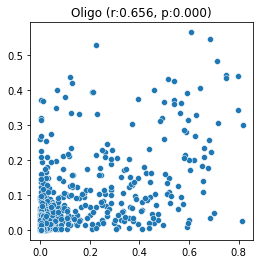

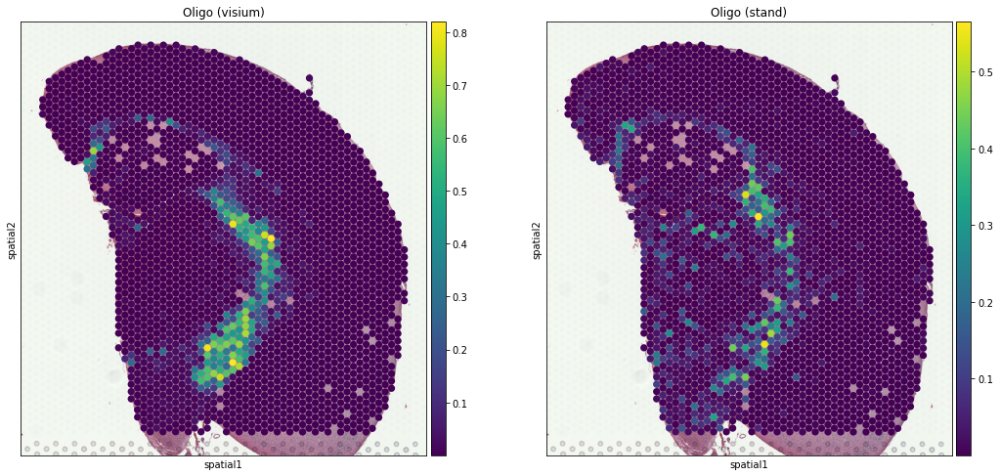

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


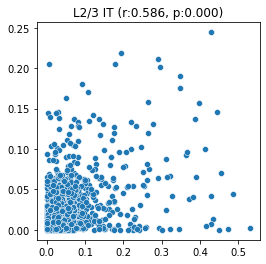

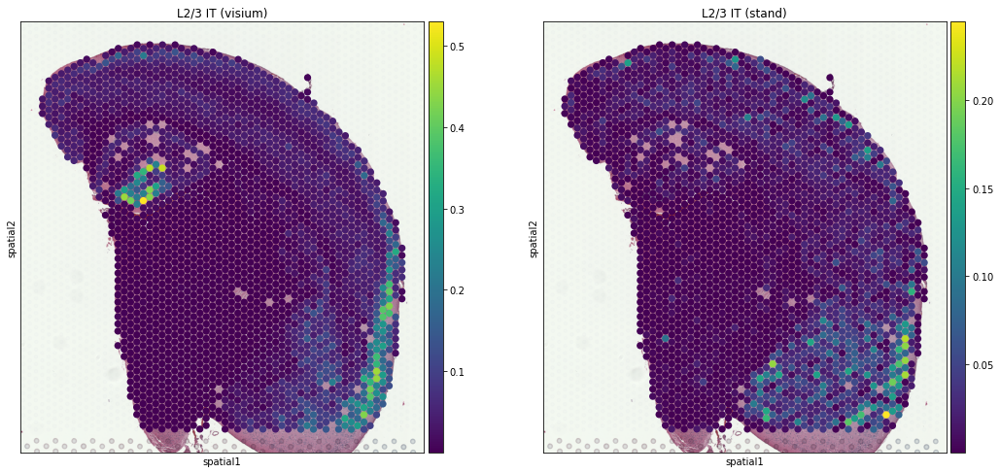

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


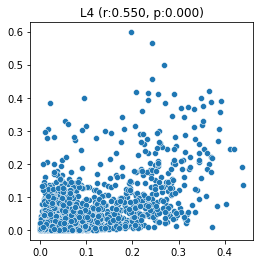

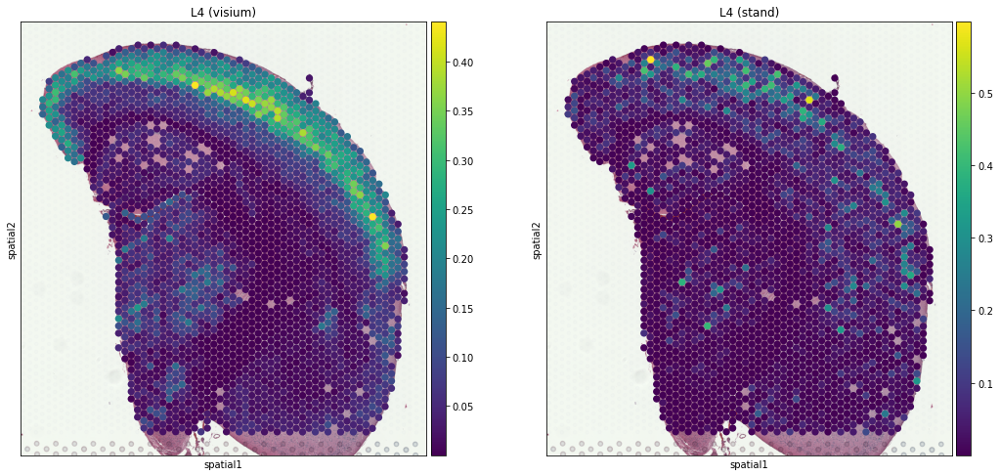

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


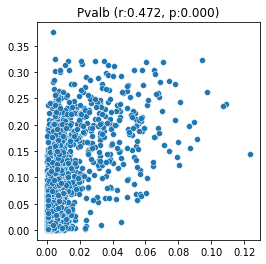

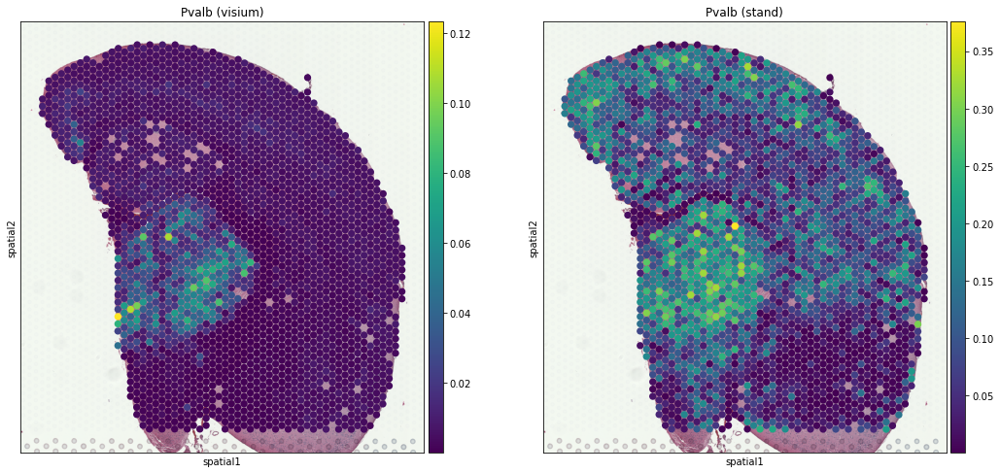

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


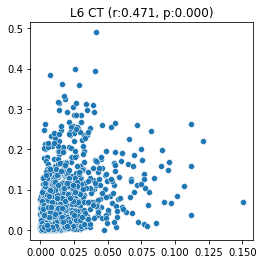

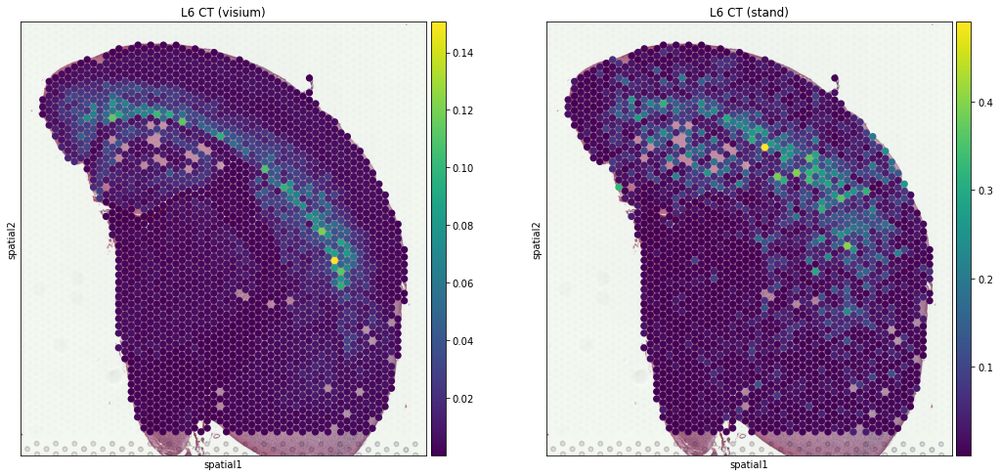

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


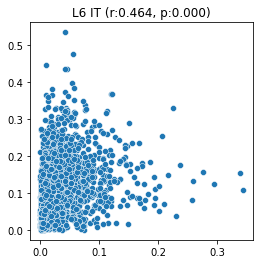

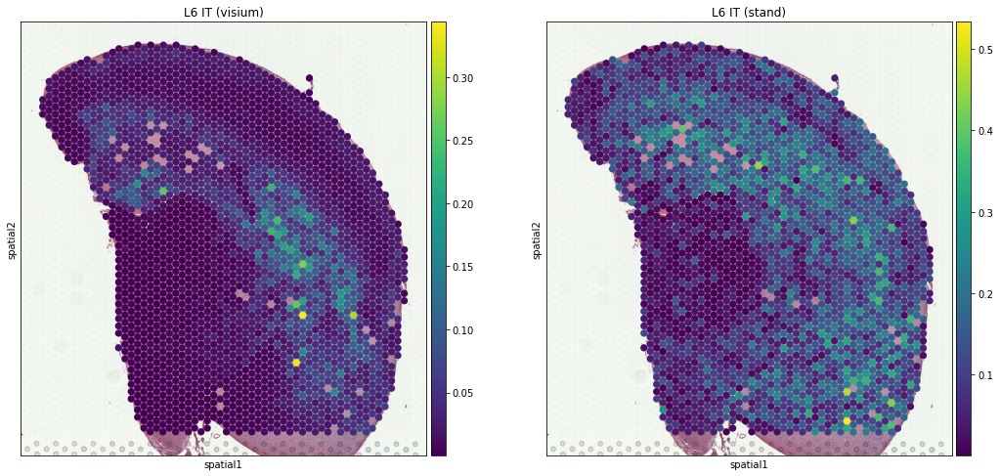

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


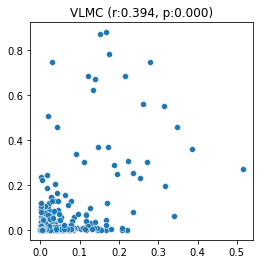

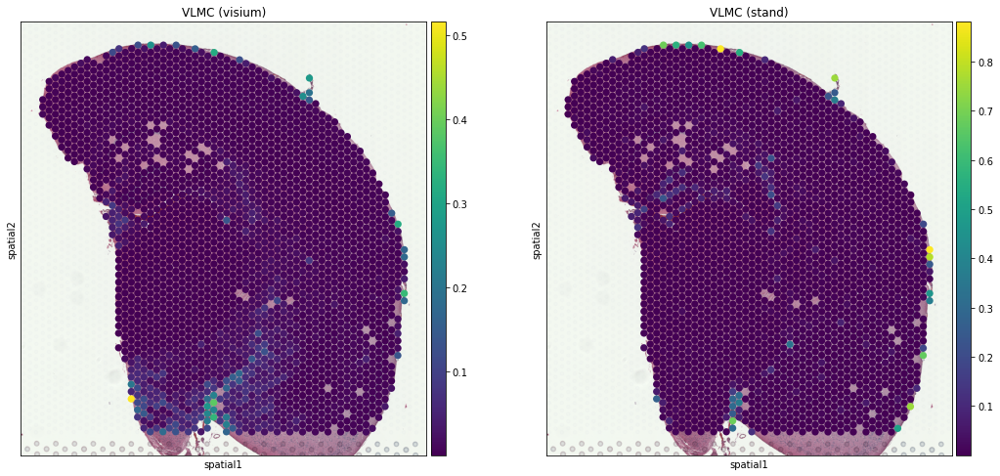

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


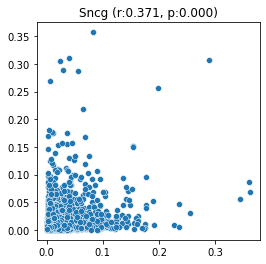

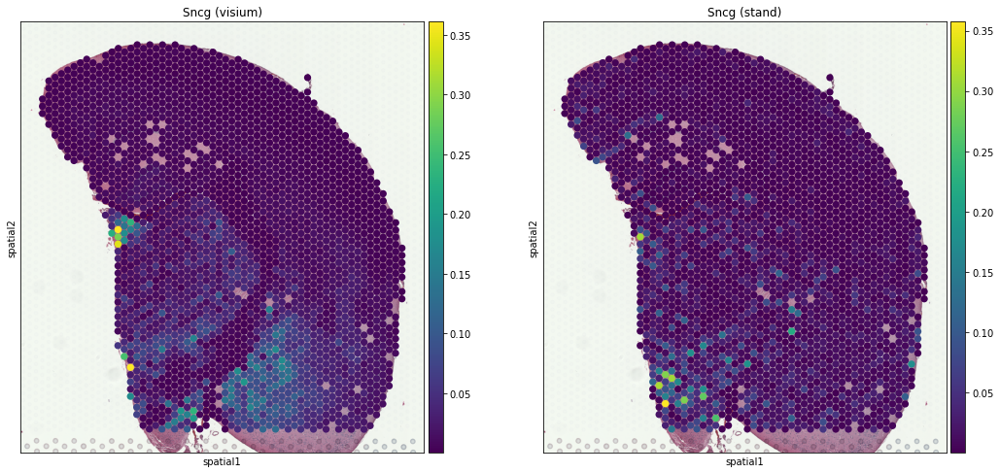

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


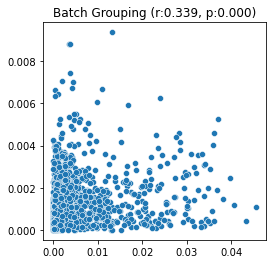

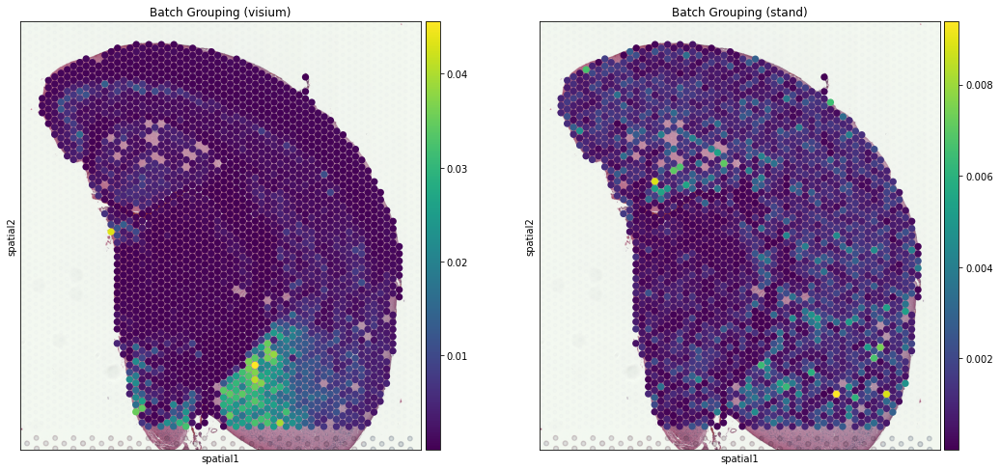

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


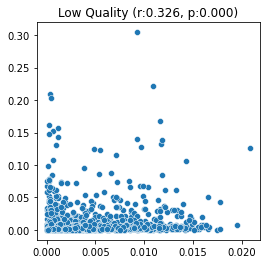

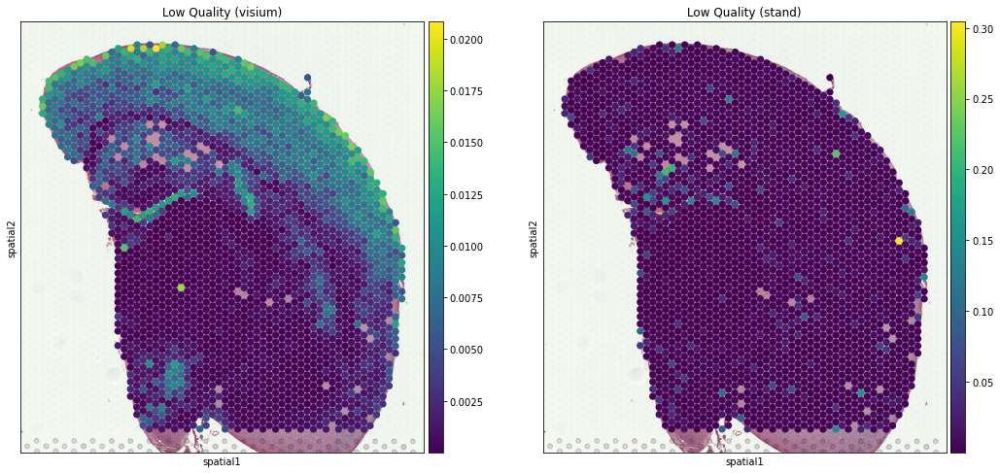

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


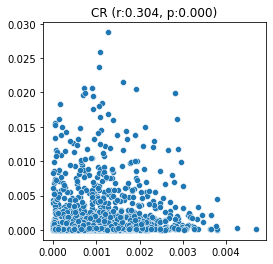

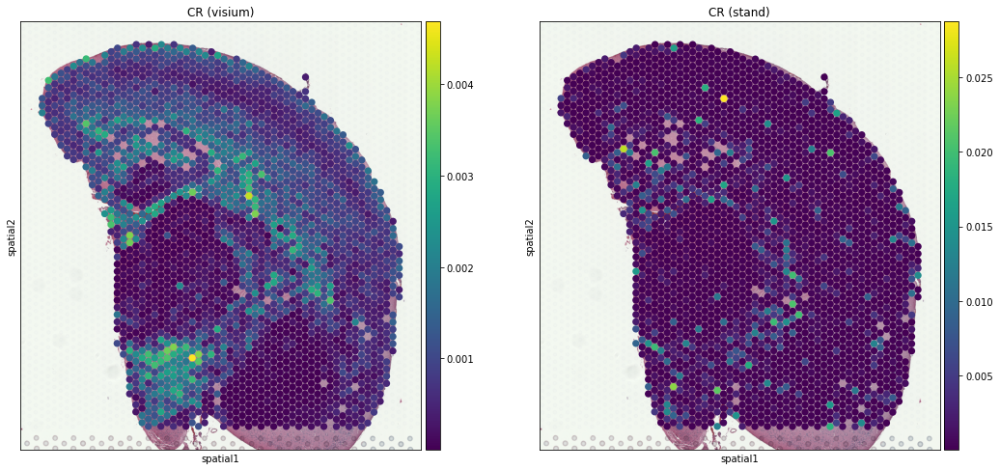

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


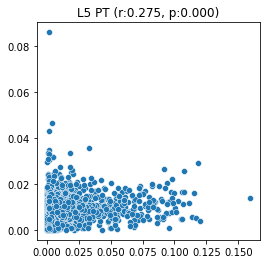

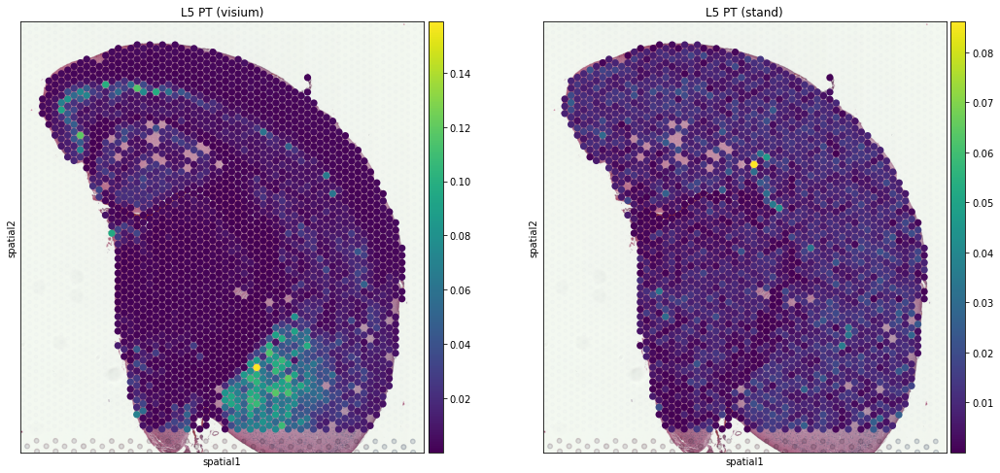

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


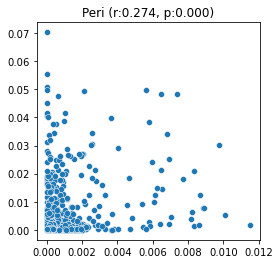

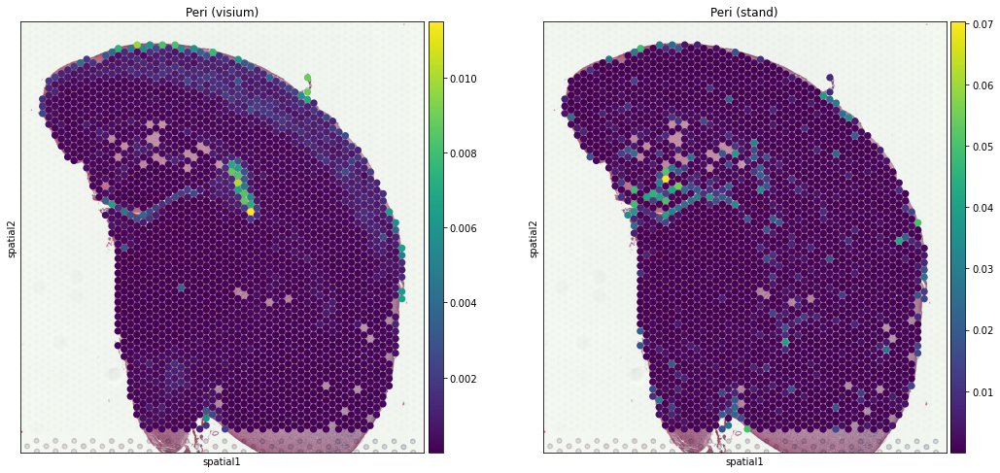

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


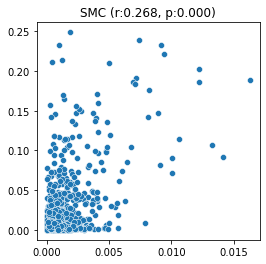

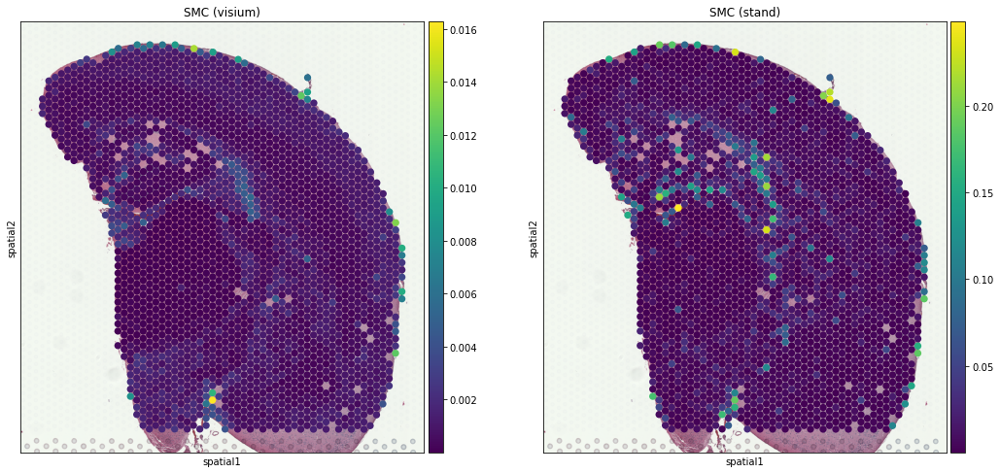

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


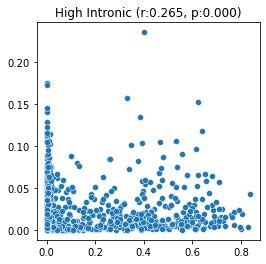

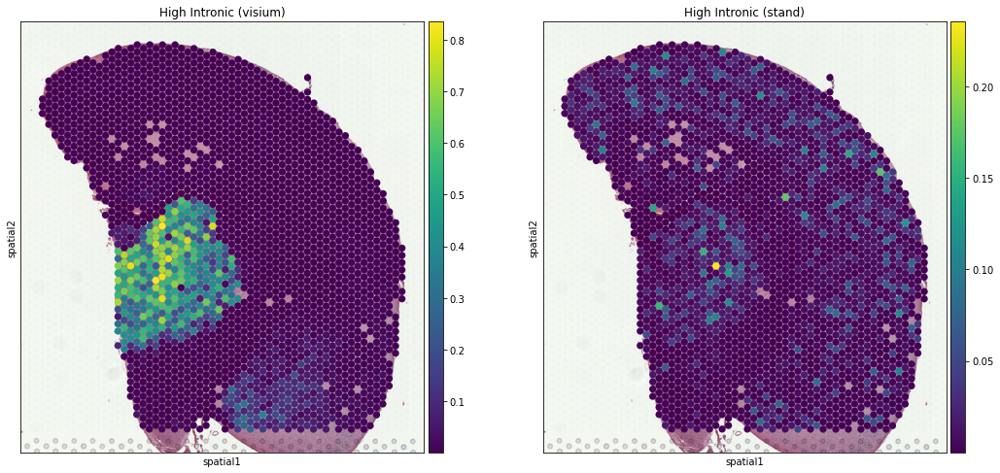

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


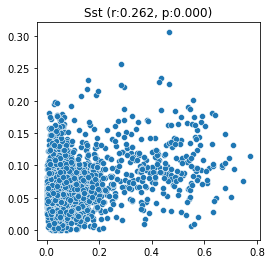

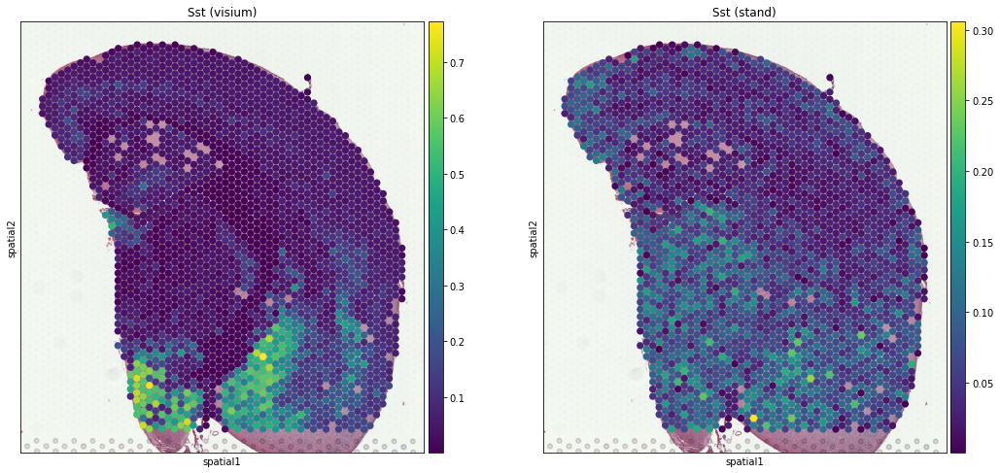

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


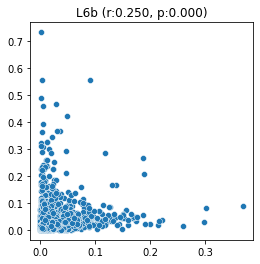

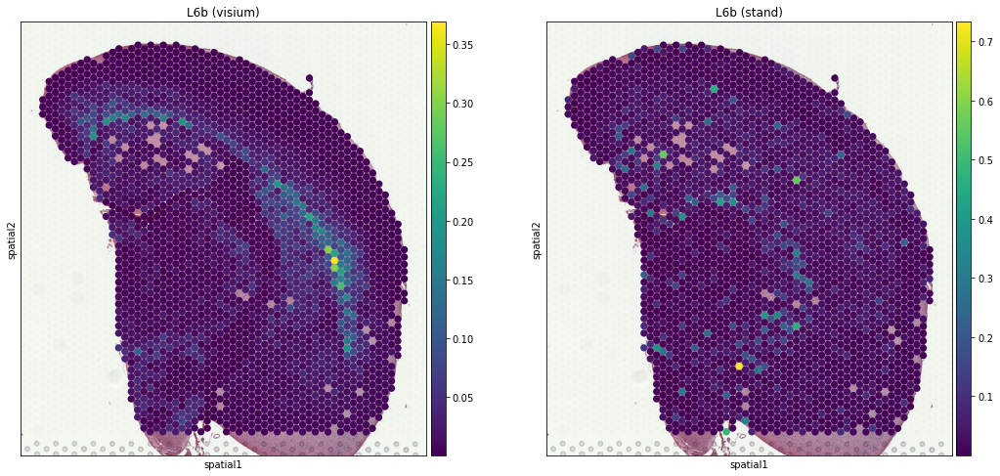

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


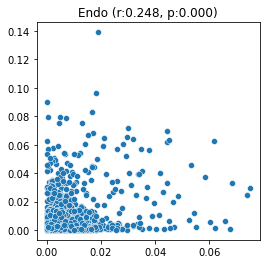

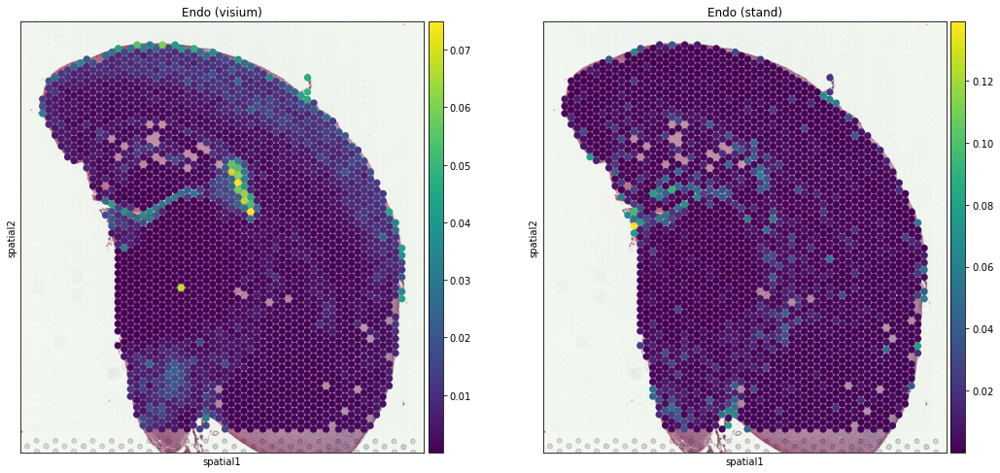

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


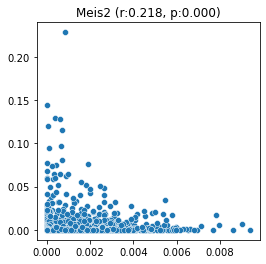

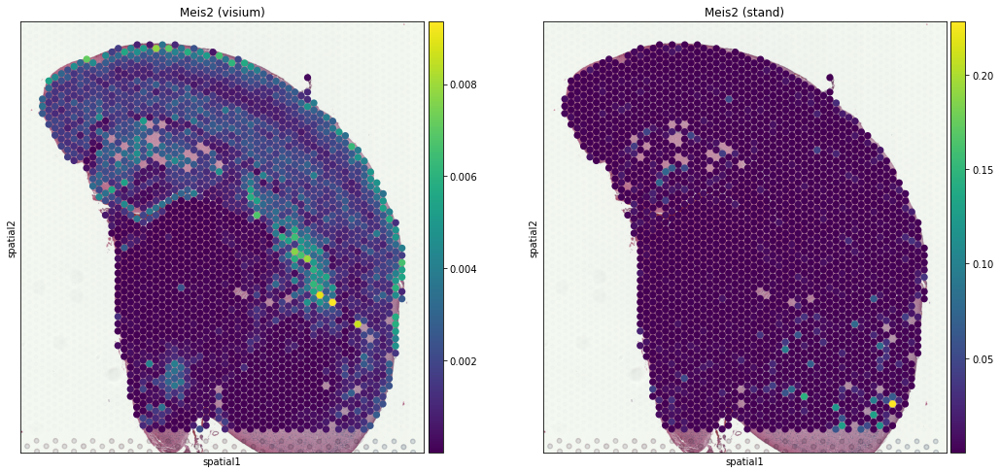

In [29]:
ranked_visium_list = df_pred_ranking[(df_pred_ranking['p-value']<0.001)&(df_pred_ranking['rho']>0.2)].sort_values(by='rho', ascending=False)['visium'].tolist()

for visium in ranked_visium_list:
    adata_spatial.obs['pred_label_sp'] = pred_sp[:,visium]
    adata_spatial.obs['pred_label_st'] = pred_st[:,visium]
    r, p = spearmanr(pred_sp[:,visium], pred_st[:,visium])

    plt.rcParams["figure.figsize"] = (4, 4)
    sns.scatterplot(pred_sp[:,visium], pred_st[:,visium]).set_title("{s} (r:{r:.3f}, p:{p:.3f})".format(s=sc_sub_dict[visium], r=r, p=p))    

    plt.rcParams["figure.figsize"] = (8, 8)
    sc.pl.spatial(
        adata_spatial,
        img_key="hires",
        color=['pred_label_sp','pred_label_st'],
        palette='Set1',
        size=1.5,
        legend_loc=None,
        title = ["{s} ({t})".format(s=sc_sub_dict[visium], t='visium'), "{s} ({t})".format(s=sc_sub_dict[visium], t='stand')])
    plt.show()

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


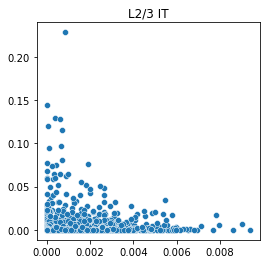

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


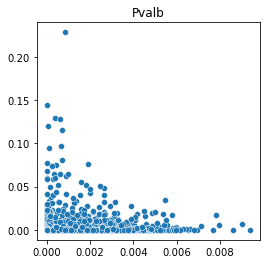

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


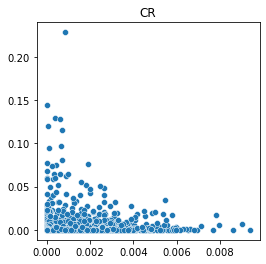

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


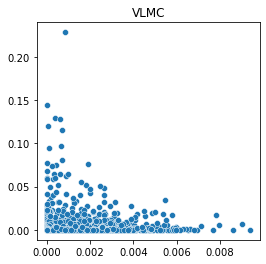

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


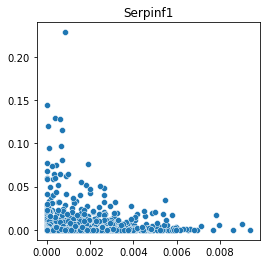

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


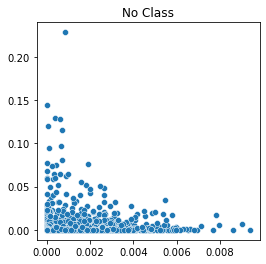

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


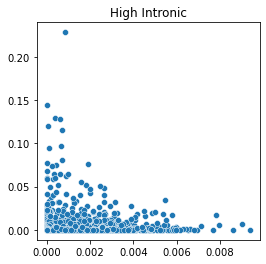

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


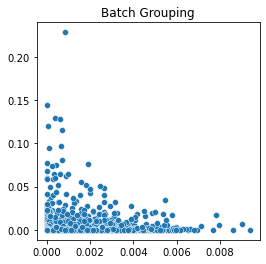

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


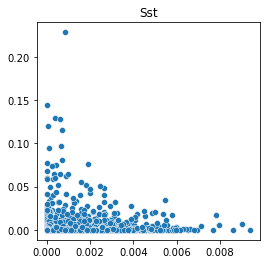

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


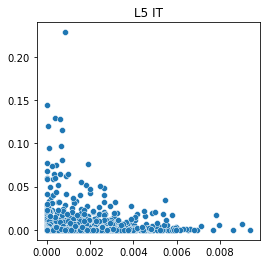

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


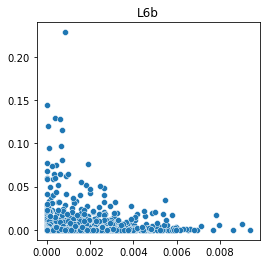

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


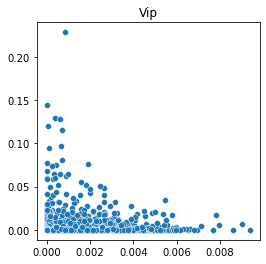

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


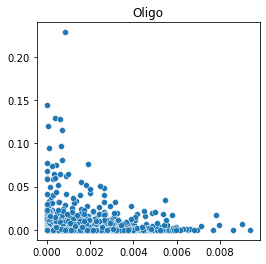

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


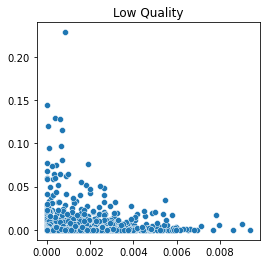

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


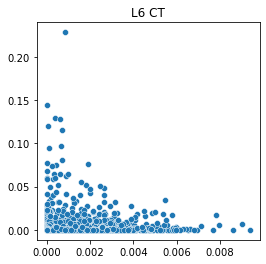

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


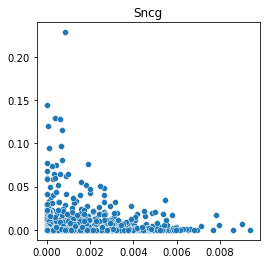

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


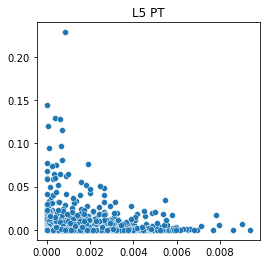

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


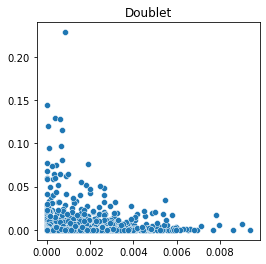

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


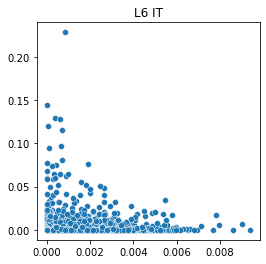

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


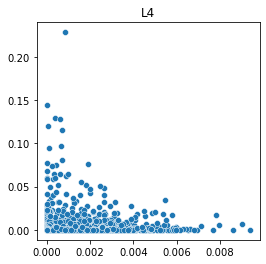

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


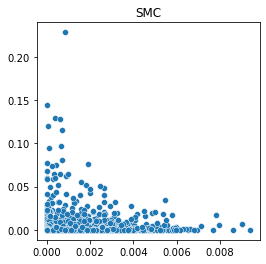

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


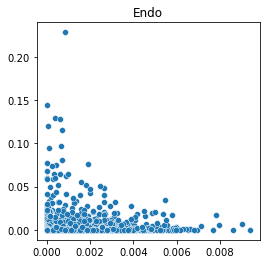

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


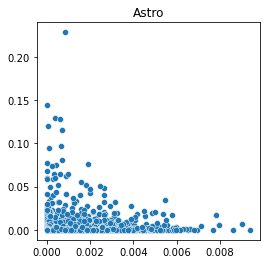

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


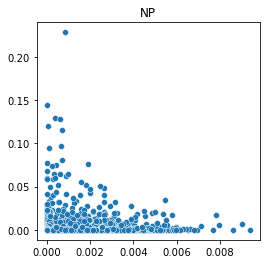

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


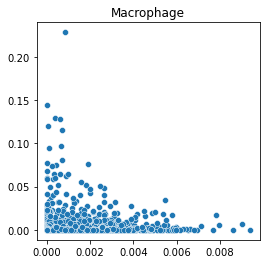

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


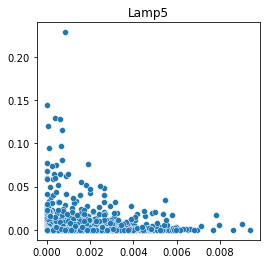

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


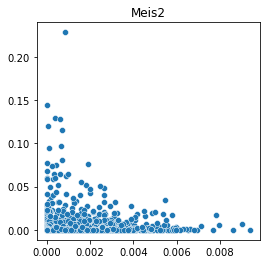

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


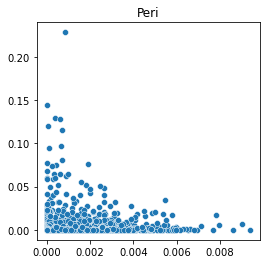

In [30]:
for visnum in visium_list:
    plt.figure(figsize=(4,4))
    sns.scatterplot(pred_sp[:,visium], pred_st[:,visium]).set_title(sc_sub_dict[visnum])
    plt.show()

- cf. Prediction of Mixture (pseudospots)


/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


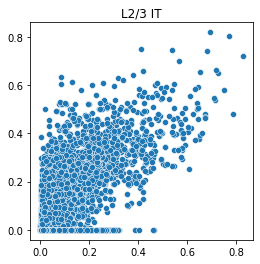

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


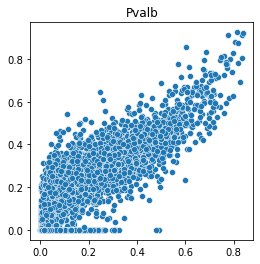

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


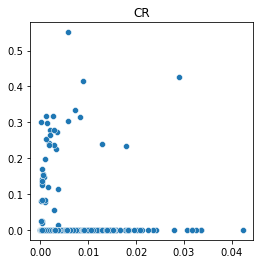

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


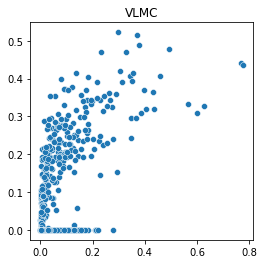

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


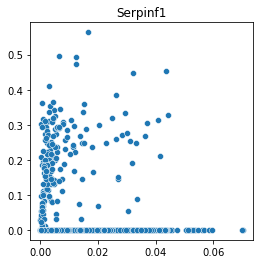

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


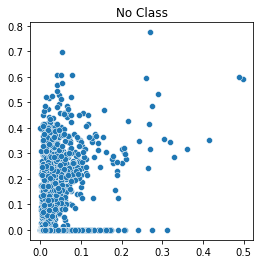

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


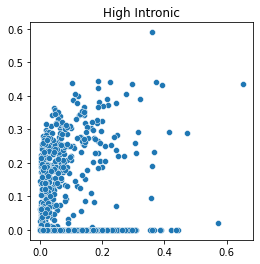

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


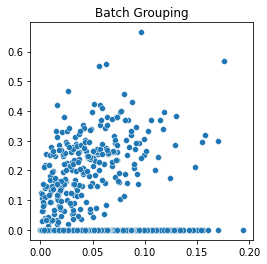

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


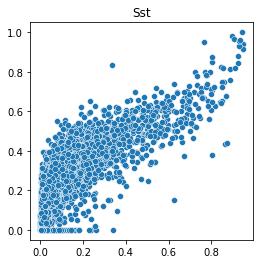

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


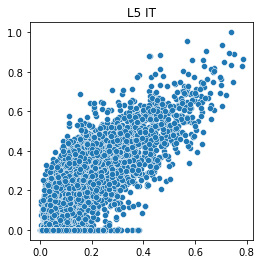

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


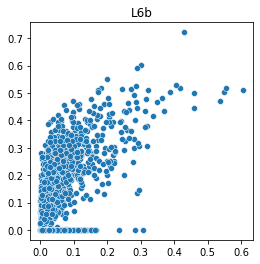

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


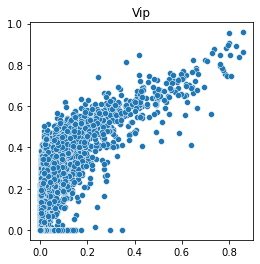

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


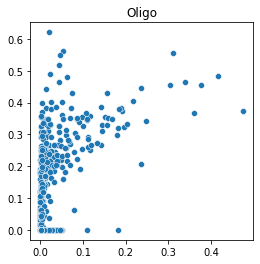

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


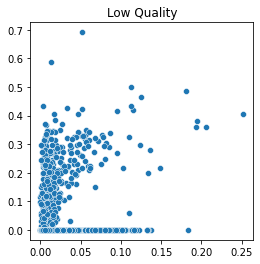

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


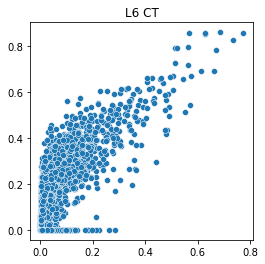

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


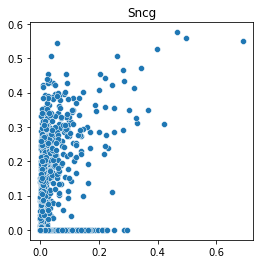

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


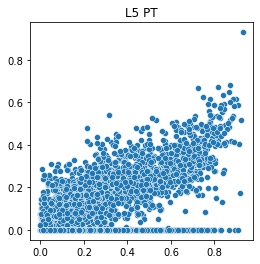

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


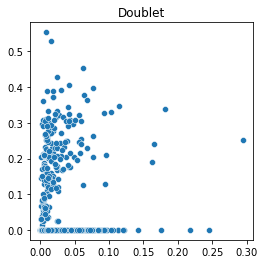

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


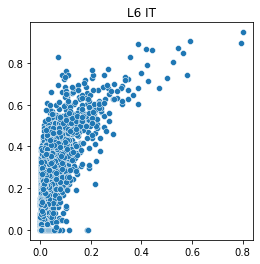

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


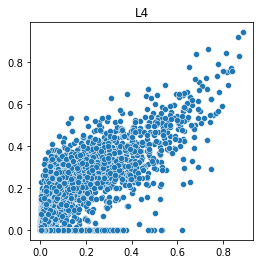

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


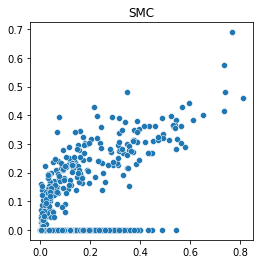

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


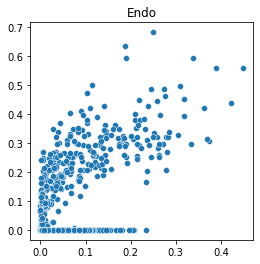

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


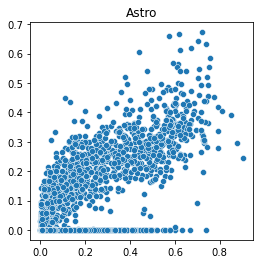

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


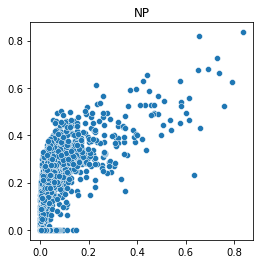

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


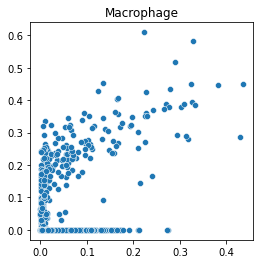

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


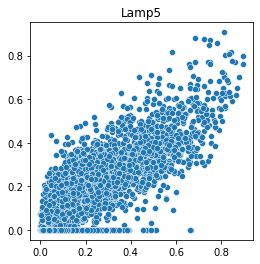

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


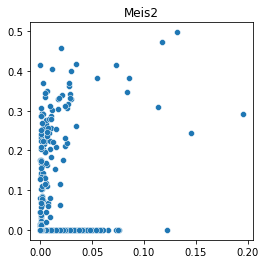

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


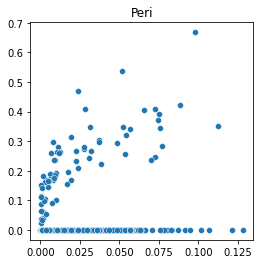

In [31]:
pred_mix = clssmodel_st.predict(sc_mix_s)

for visnum in visium_list:
    plt.figure(figsize=(4,4))
    sns.scatterplot(pred_mix[:,visnum], lab_mix[:,visnum]).set_title(sc_sub_dict[visnum])
    plt.show()

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


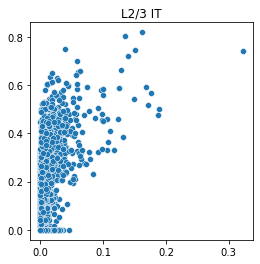

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


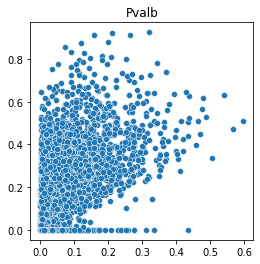

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


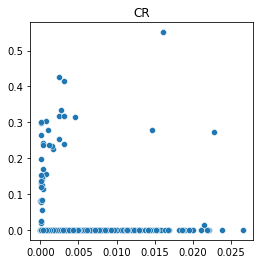

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


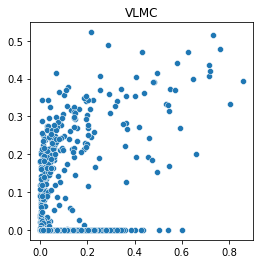

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


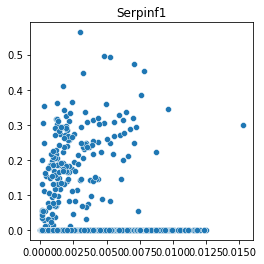

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


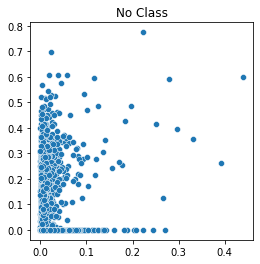

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


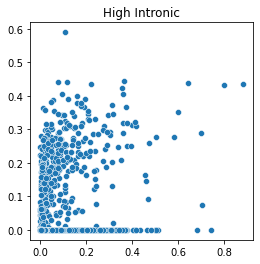

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


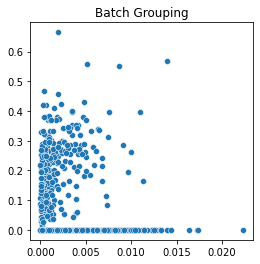

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


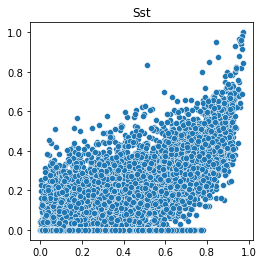

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


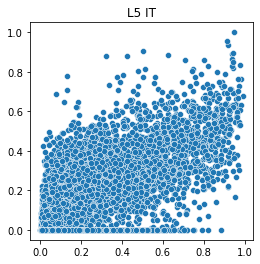

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


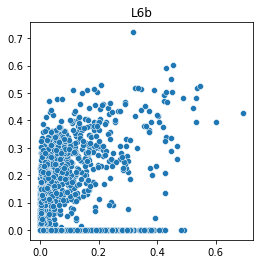

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


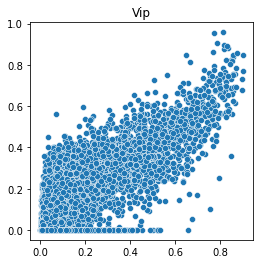

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


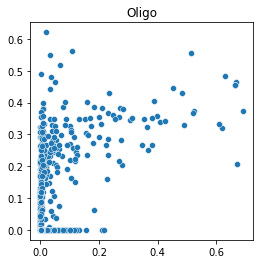

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


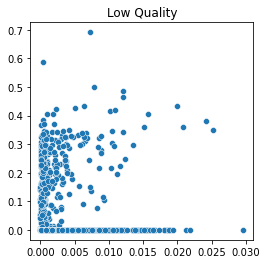

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


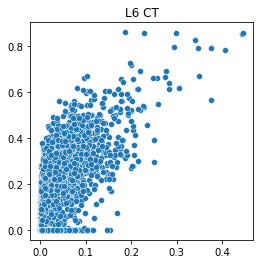

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


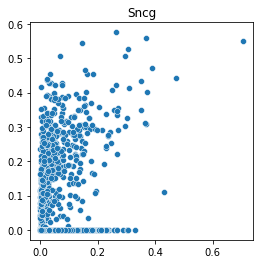

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


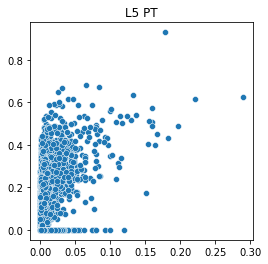

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


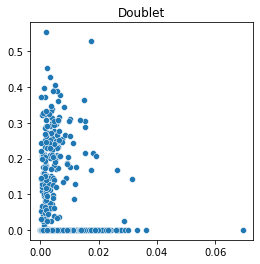

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


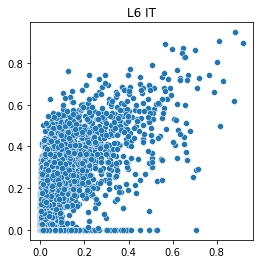

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


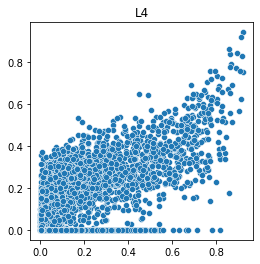

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


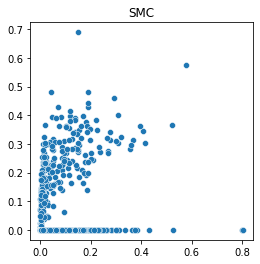

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


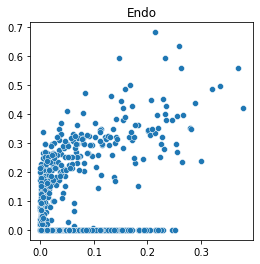

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


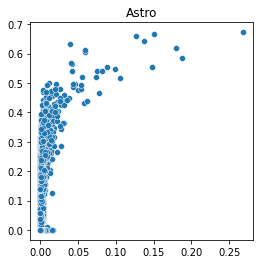

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


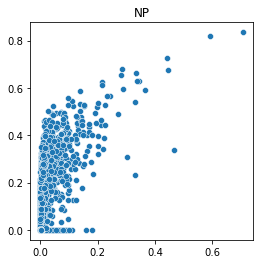

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


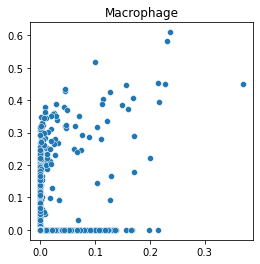

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


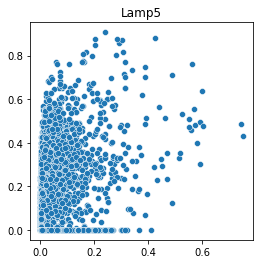

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


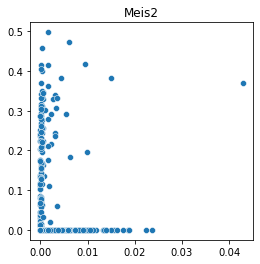

/opt/anaconda3/envs/p/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


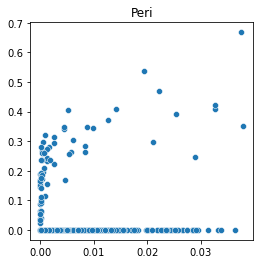

In [32]:
pred_mix = clssmodel_sp.predict(sc_mix_s)

for visnum in visium_list:
    plt.figure(figsize=(4,4))
    sns.scatterplot(pred_mix[:,visnum], lab_mix[:,visnum]).set_title(sc_sub_dict[visnum])
    plt.show()